# PDF vs. CDF, `requests`, `BeautifulSoup`
* Continuous data: PDF vs. CDF
* Requests: get the data
* Wikipedia example: messing with HTML
* BeautifulSoup: parse the data
* Worksheet

## A little stats review.

<font color=blue>***This is critical content for data people: what's the difference between a PMF and a PDF for a random variable? What's a CDF? <font color=red>A PMF is a `probability mass function` for a discrete random variable. It maps possible values of the discrete r.v. to the probability that the r.v. will take on that value. A PDF is a `probability density function` for a continuous random variable. It maps the possible values of the continuous r.v. to their associated `probability densities`. <br><br>Probability densities are not actual probabilities. We can only get probabilities that the value of a continuous random variable will fall within an interval. We get this probability by integrating the PDF over the given interval. In other words, it's the area under the graph of the PDF. <br><br>The CDF(x) is the probability that a random variable will be between $-\infty$ and x. Both PMF's and PDF's have CDF's. For continuous data, this means that it's the area under the PDF curve to the left of x. Here's the graph of the PDF and CDF for the normal distribution:***

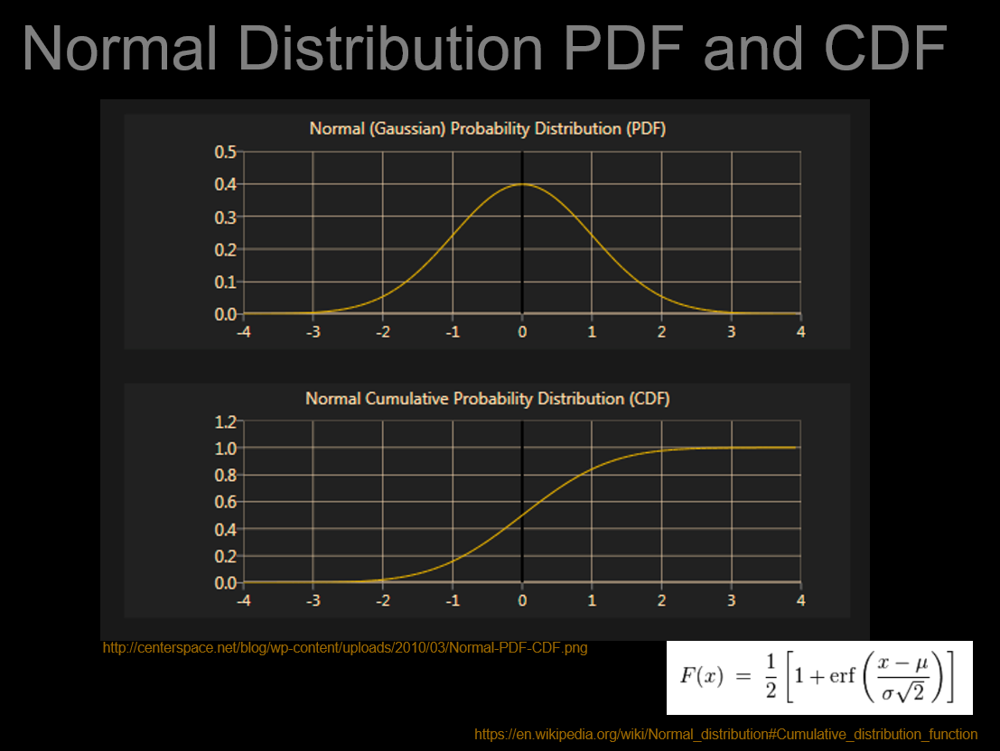

<font color=blue>***For any continuous random variable, what is $CDF(-\infty)$? $CDF(\infty)$?***

<font color=red>***In practice, what we have to work with is some data. How we go from some data for a continuous random variable to an estimated PDF:*** 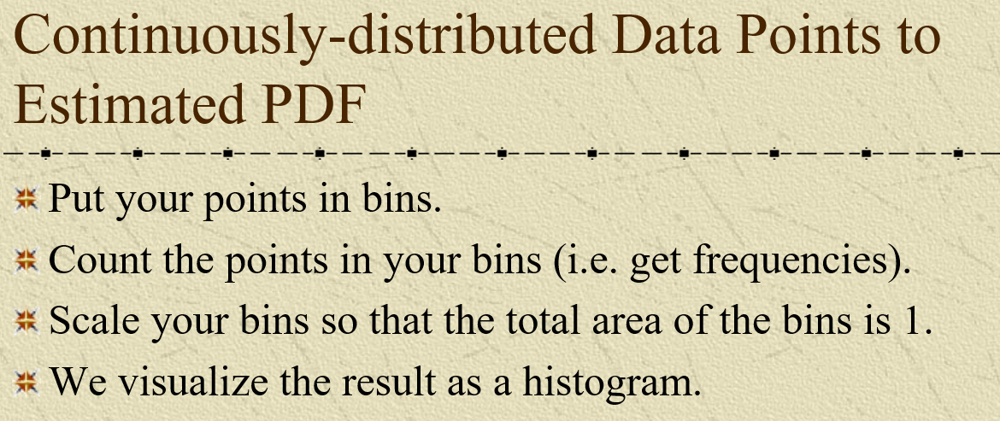

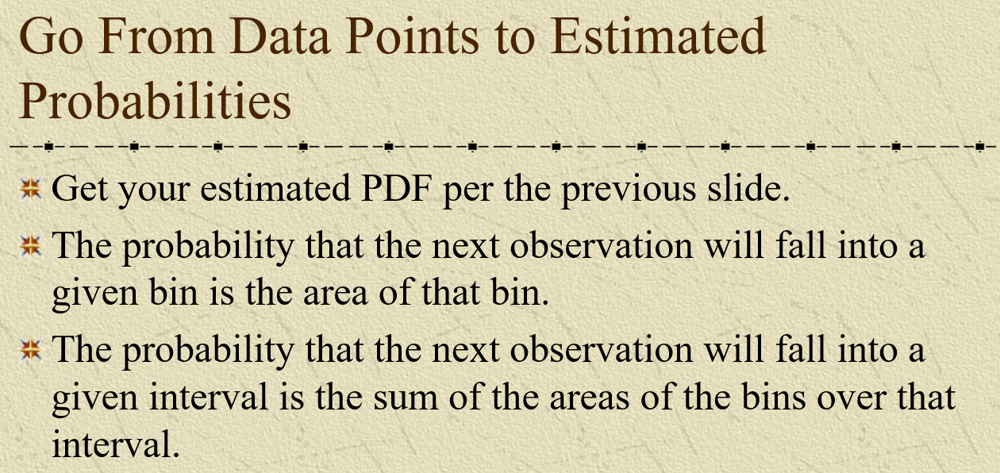

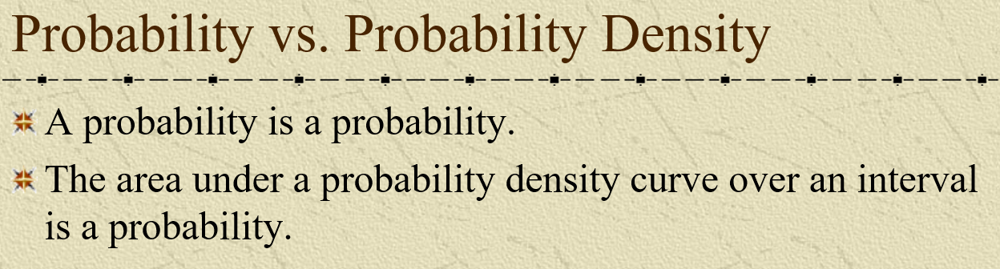

## Web scraping 

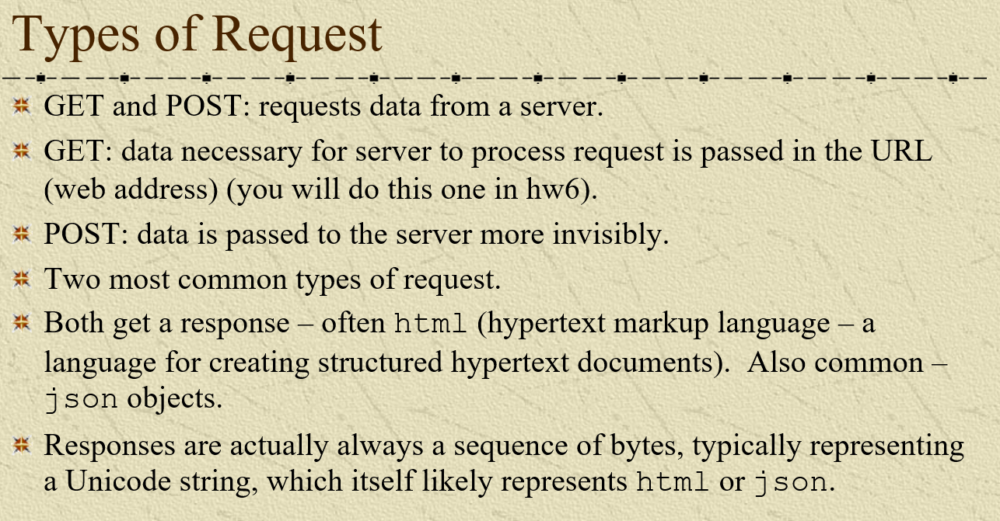

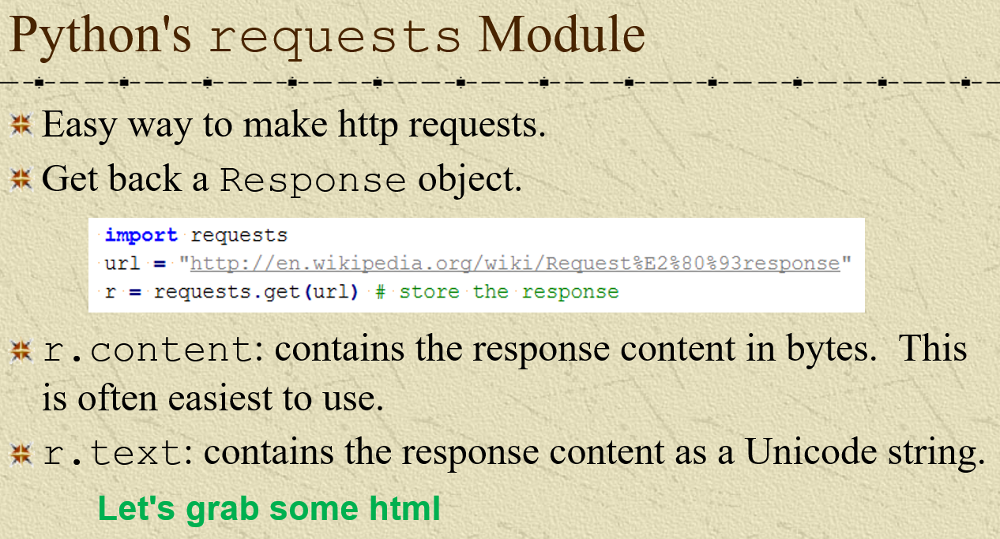

<font color=red>***Let's scrape this page:***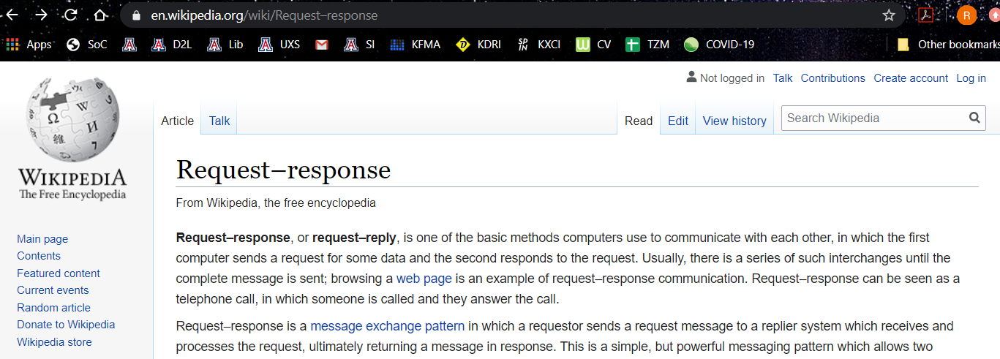

In [1]:
import requests
url = "https://en.wikipedia.org/wiki/Request%E2%80%93response"
r = requests.get(url)

In [2]:
r

<Response [200]>

In [3]:
d = dir(r)
d[:5]

['__attrs__', '__bool__', '__class__', '__delattr__', '__dict__']

In [4]:
d[-5:]

['reason', 'request', 'status_code', 'text', 'url']

<font color=red>***The response HTML as a `bytes` object (which is often the easiest to work with):***

In [5]:
r.content

b'\n<!DOCTYPE html>\n<html class="client-nojs" lang="en" dir="ltr">\n<head>\n<meta charset="UTF-8"/>\n<title>Request\xe2\x80\x93response - Wikipedia</title>\n<script>document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"e50ca2e3-3527-46c2-9f46-a70315f6381c","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"Request\xe2\x80\x93response","wgTitle":"Request\xe2\x80\x93response","wgCurRevisionId":936993429,"wgRevisionId":936993429,"wgArticleId":10175634,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Network protocols"],"wgPageContentLanguage":"en","wgPageContentModel":"wikitext","wgRelevantPageName":"Request\xe2\x8

<font color=red>***The response HTML as a text string:***

In [6]:
r.text

'\n<!DOCTYPE html>\n<html class="client-nojs" lang="en" dir="ltr">\n<head>\n<meta charset="UTF-8"/>\n<title>Request–response - Wikipedia</title>\n<script>document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"e50ca2e3-3527-46c2-9f46-a70315f6381c","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"Request–response","wgTitle":"Request–response","wgCurRevisionId":936993429,"wgRevisionId":936993429,"wgArticleId":10175634,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCategories":["Network protocols"],"wgPageContentLanguage":"en","wgPageContentModel":"wikitext","wgRelevantPageName":"Request–response","wgRelevantArticleId":10175634

<font color=red>***A bunch of info about the request-response process. Checkout `content-type` and `Content-Encoding`:***

In [7]:
for key in r.headers:
    print(key, '-->', r.headers[key])

Date --> Wed, 08 Apr 2020 17:26:00 GMT
Vary --> Accept-Encoding,Cookie,Authorization
Server --> ATS/8.0.6
x-content-type-options --> nosniff
p3p --> CP="See https://en.wikipedia.org/wiki/Special:CentralAutoLogin/P3P for more info."
content-language --> en
last-modified --> Wed, 01 Apr 2020 07:25:12 GMT
content-type --> text/html; charset=UTF-8
Content-Encoding --> gzip
Age --> 13396
X-Cache --> cp4028 miss, cp4031 hit/1
X-Cache-Status --> hit-front
Server-Timing --> cache;desc="hit-front"
Strict-Transport-Security --> max-age=106384710; includeSubDomains; preload
Set-Cookie --> WMF-Last-Access=08-Apr-2020;Path=/;HttpOnly;secure;Expires=Sun, 10 May 2020 12:00:00 GMT, WMF-Last-Access-Global=08-Apr-2020;Path=/;Domain=.wikipedia.org;HttpOnly;secure;Expires=Sun, 10 May 2020 12:00:00 GMT, GeoIP=US:AZ:Tucson:32.25:-110.94:v4; Path=/; secure; Domain=.wikipedia.org
X-Client-IP --> 150.135.165.107
Cache-Control --> private, s-maxage=0, max-age=0, must-revalidate
Accept-Ranges --> bytes
Content-L

In [8]:
with open('response_bytes.html', 'wb') as fp:
    fp.write(r.content)

<font color=red>***Let's double-click on the file we just made and see what pops up in the browser:***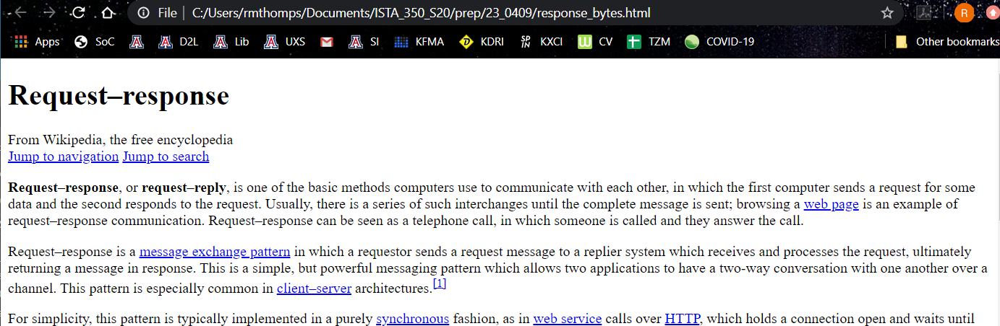

<font color=red>***Well, the main content is there, but a lot of elements are missing. Let's check it in a text editor:***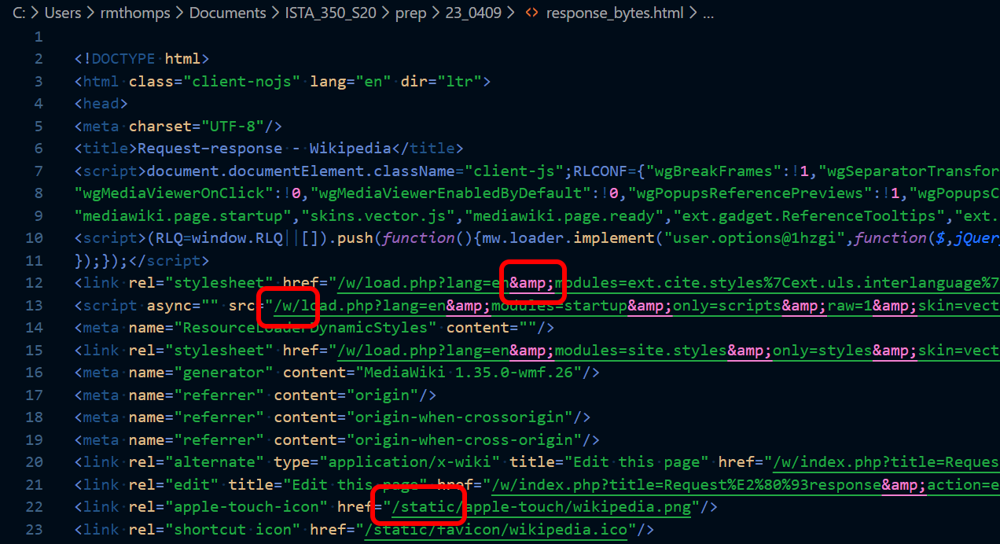

<font color=red>***We can see some issues. First, `requests` has escaped all of the ampersands to protect us from ourselves. Also, many of the links are relative paths. Our browser when communicating with Wikipedia's server knows how to complete them, but when it sees them from a file on our computer, it's lost. So let's make these replacements:***<br>
* replace all `&amp;` with `&`
* replace all `="/w` with `="https://en.wikipedia.org/w`
* replace all `="/static` with `="https://en.wikipedia.org/static`<br><br>
    
***Ok, let's reload and see what we have:***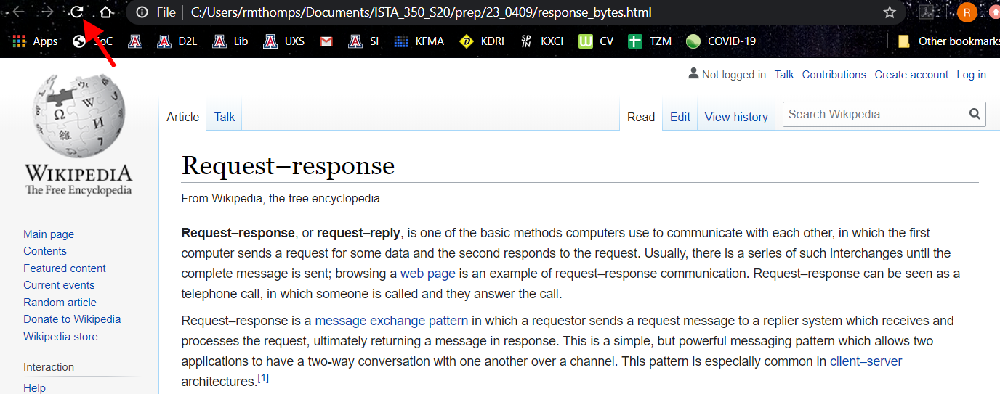

<font color=red>***Ok, now the browser can find the resources it needs to mostly reconstruct the page.***

<font color=red>***So why does `requests` feel the need to protect us from ourselves? Because as web devs, the back end scripts we write take input we get from the user and incorporate into the response HTML. If we don't protect ourselves, bad things can happen:***<br>https://stackoverflow.com/questions/42728605/why-these-5-6-characters-are-considered-unsafe-html-characters

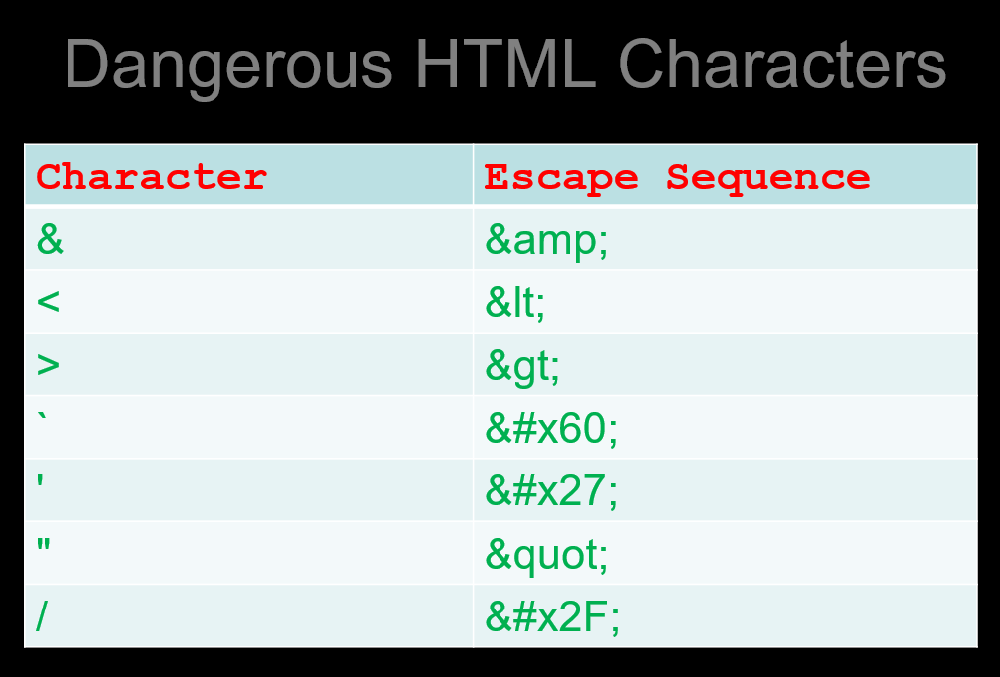

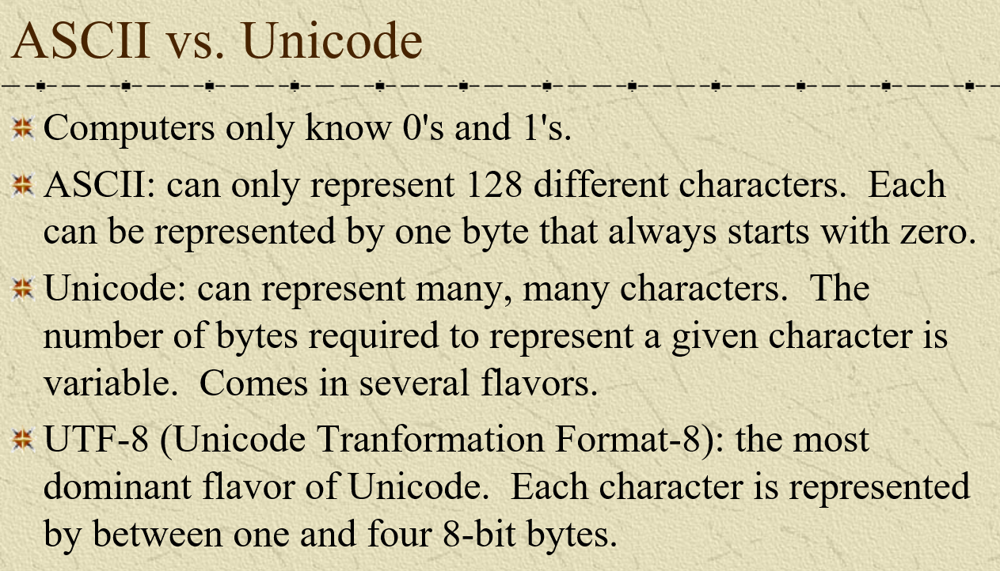

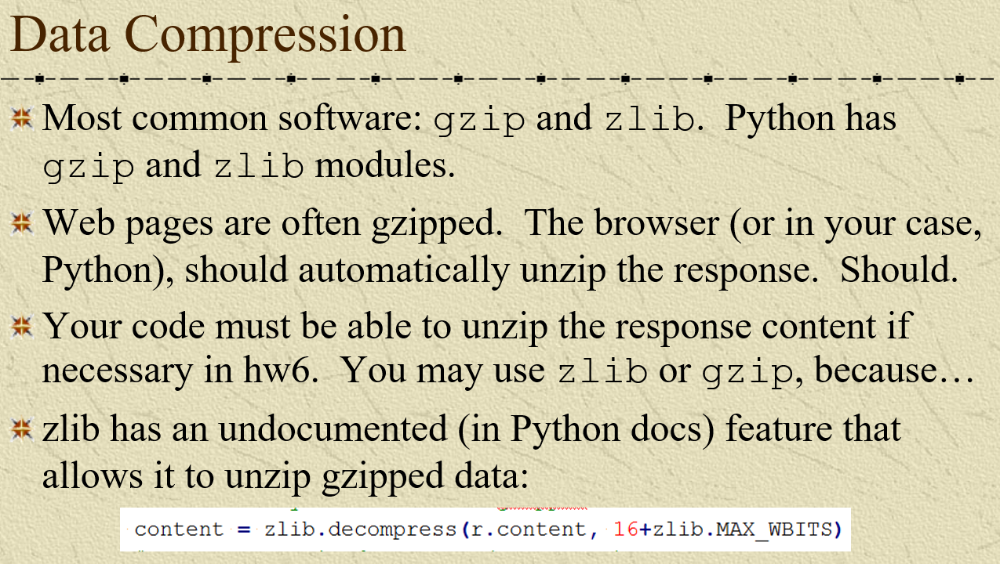

## Parsing HTML with `BeautifulSoup`

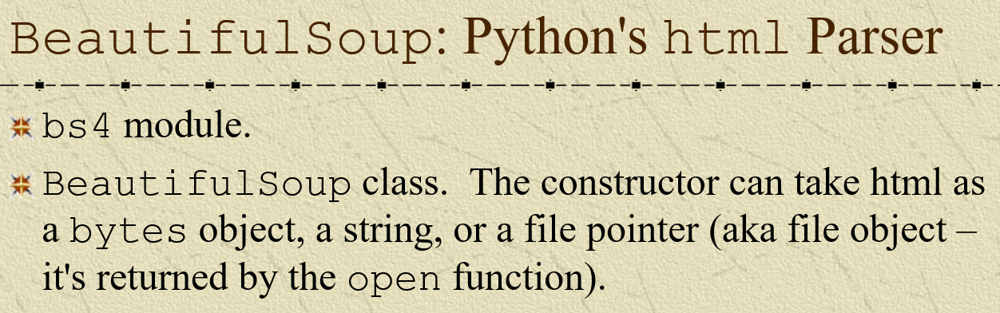

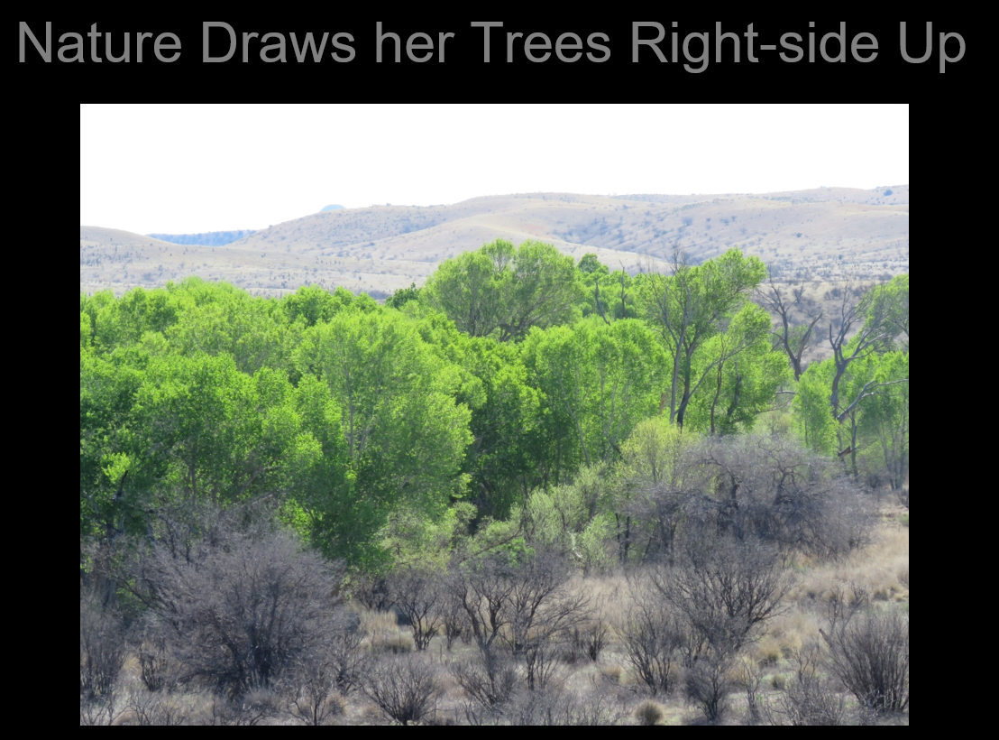

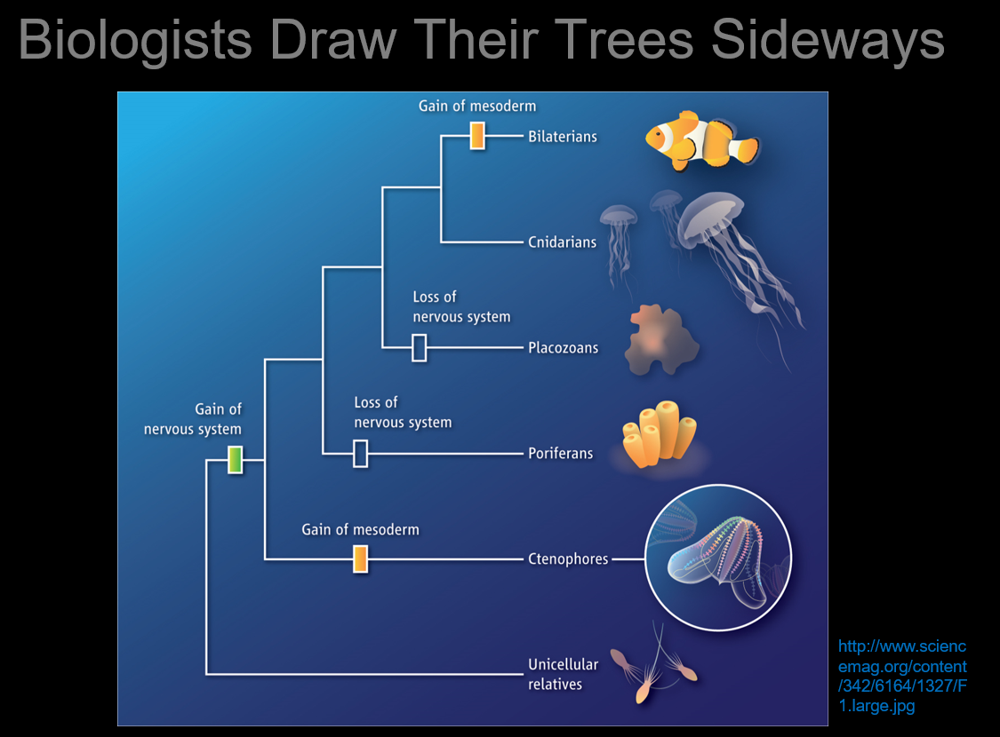

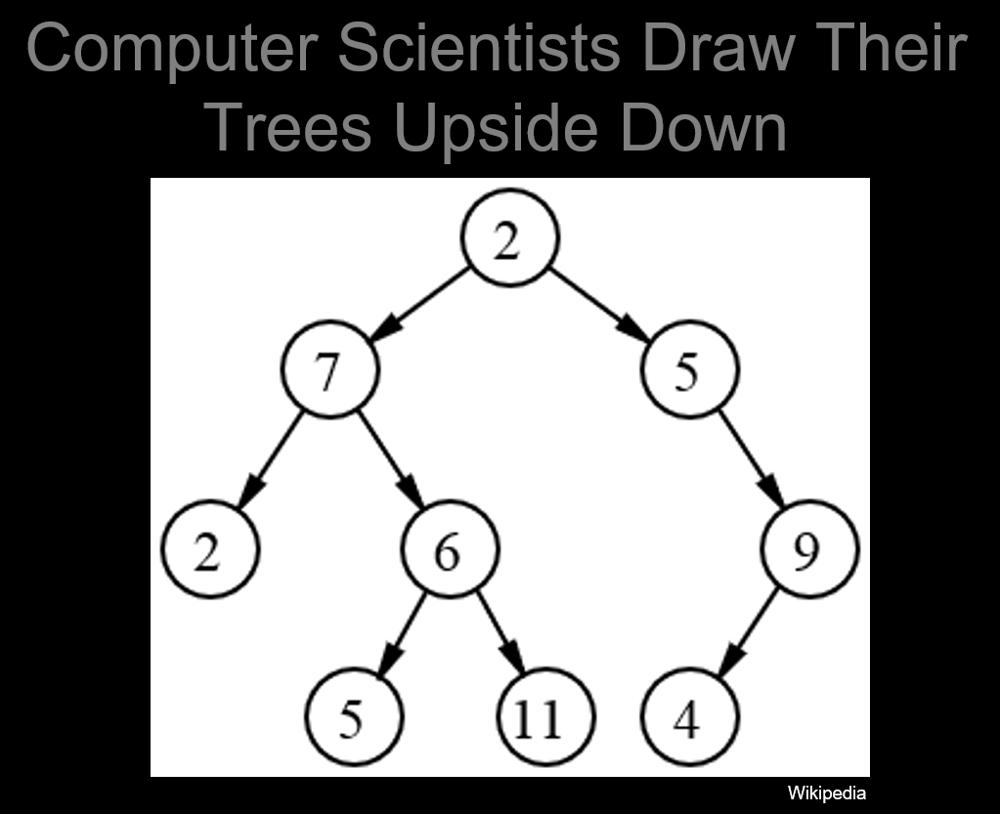

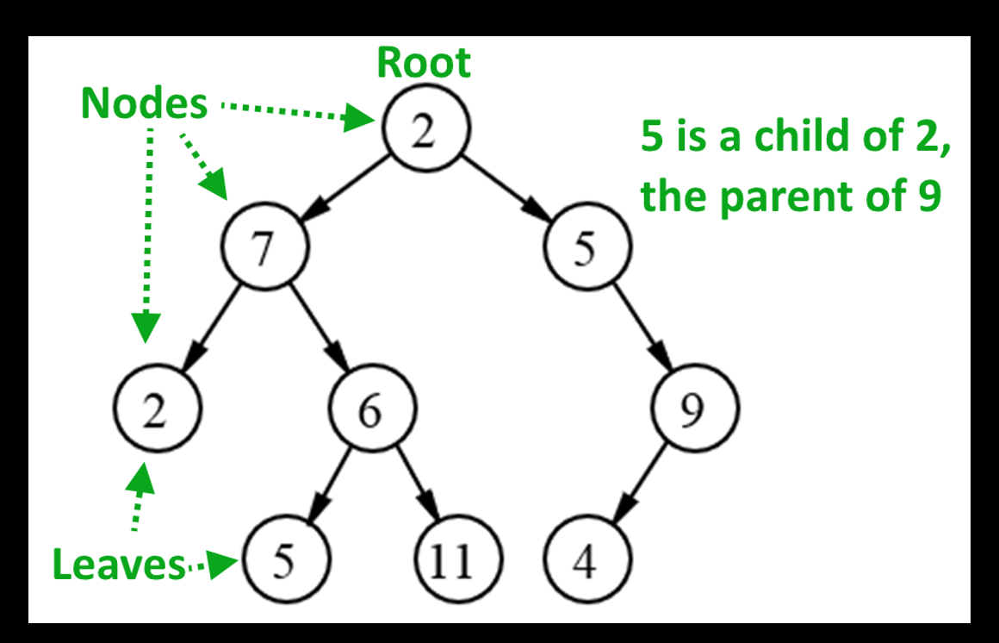

<font color=red>***So, you ask, what do trees have to do with HTML? Good question. Let's take a look.***

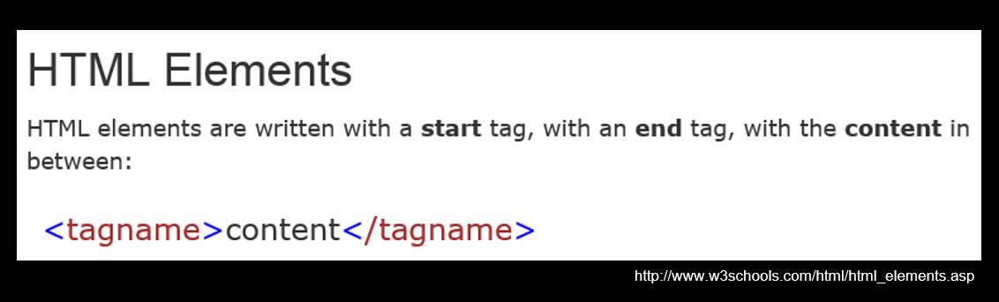

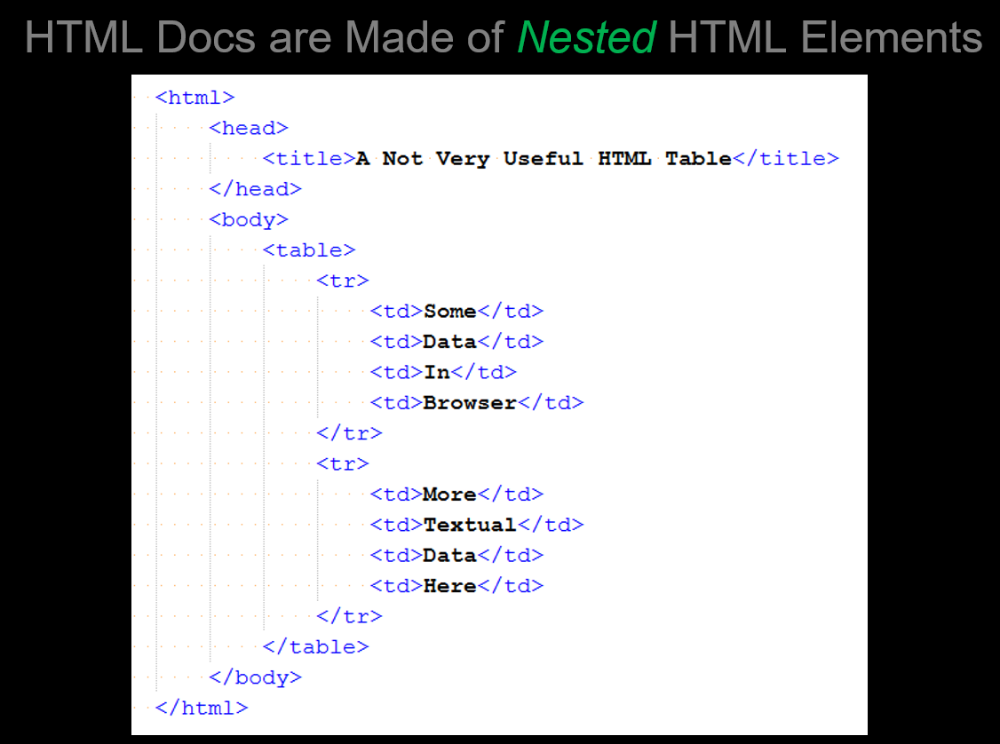

<font color=red>***That HTML file should remind you of the biologists sideways tree above. Because the elements are hierarchical, i.e. nested, we can represent them as a tree. Which is exactly what Javascripts Document Object Model (DOM) does. And our parser, `BeautifulSoup` will do.***

<font color=red>***Data on webpages is often stored in HTML `table` elements. A `table` element is composed of table rows, i.e. `tr` elements. Each `tr` has table date, `td`, fields.***

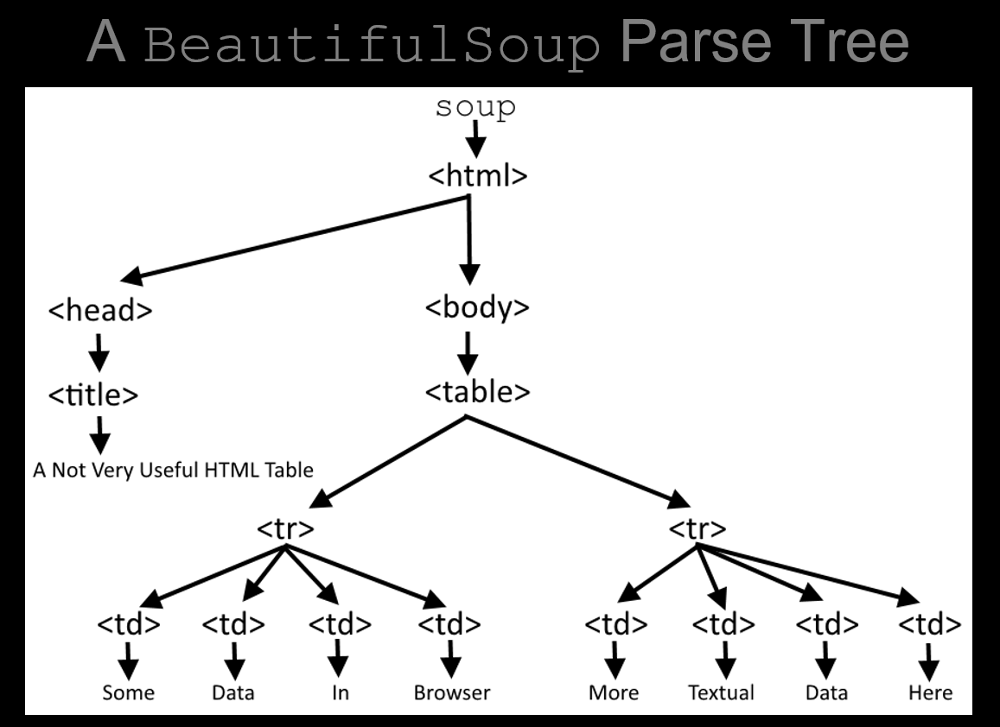

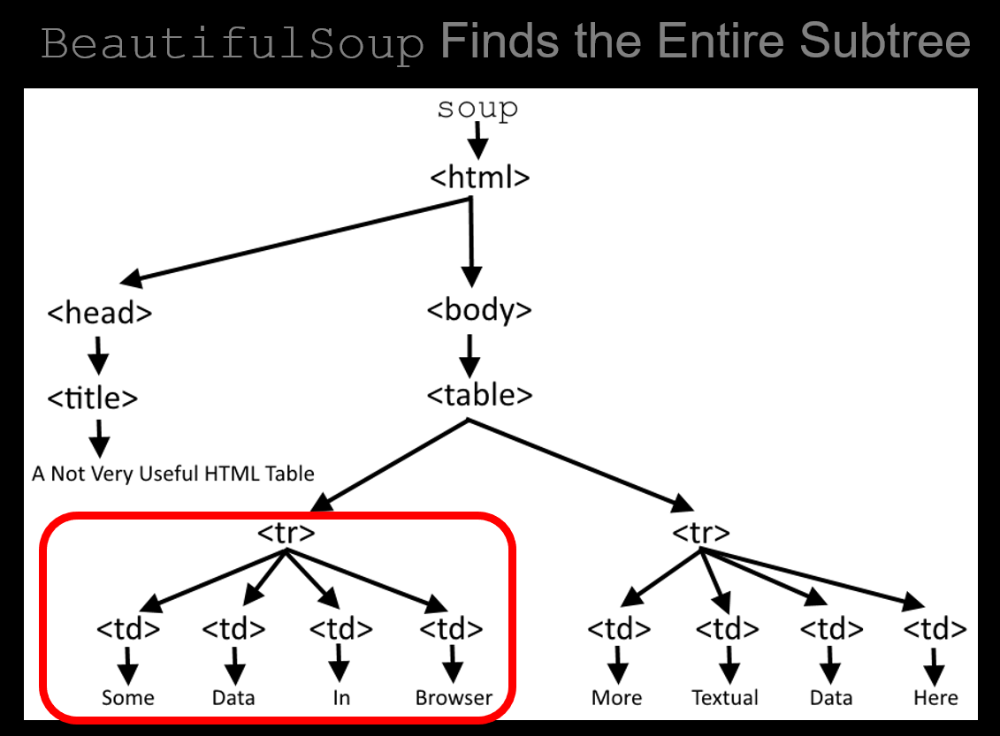

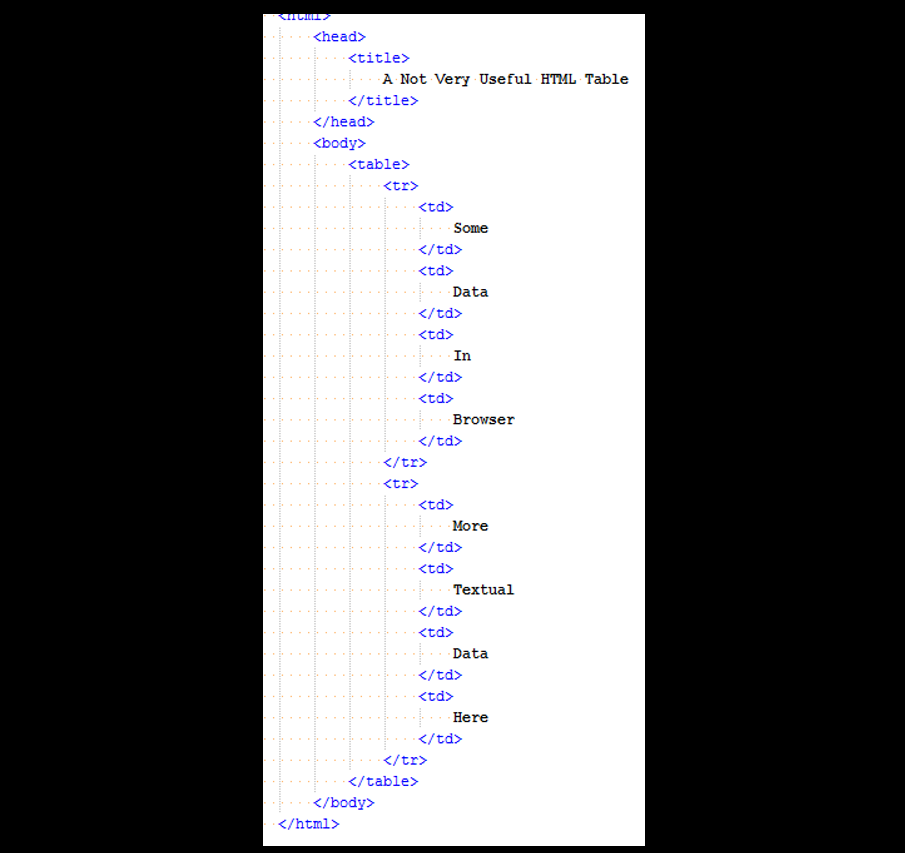

<font color=red>***If we double-click on the file above, written to really emphasize the tree heirarchical structure of the HTML, it renders like this:***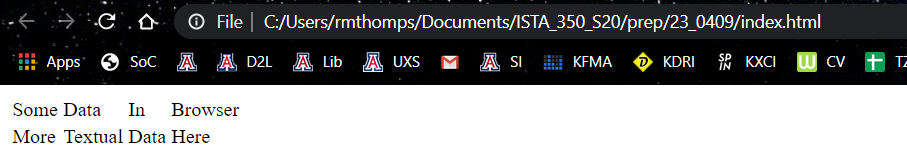

<font color=red>***Let's parse this HTML using `BeautifulSoup`.***<br>https://www.crummy.com/software/BeautifulSoup/bs4/doc/

In [9]:
from bs4 import BeautifulSoup

<font color=red>***A `BeautifulSoup` object is a parse tree of HTML elements and `NavigableStrings` (which contain the whitespace in the HTML file between elements - everything goes into the tree, which is problematic). What we get back from a call to the constructor is a pointer to the root of the tree. From any element in the tree, we can get the first element of a given type in that element's subtree using the dot operator and the name of the element:***

In [10]:
soup = BeautifulSoup(open('index.html'))
soup.tr.contents

['\n',
 <td>
                         Some
                     </td>,
 '\n',
 <td>
                         Data
                     </td>,
 '\n',
 <td>
                         In
                     </td>,
 '\n',
 <td>
                         Browser
                     </td>,
 '\n']

In [11]:
soup.tr.next_sibling.contents

AttributeError: 'NavigableString' object has no attribute 'contents'

<font color=red>***The `BeautifulSoup` parse tree contains everything - the HTML elements and all of the whitespace in the file, stored in `NavigableString` objects, whatever those are. But they don't have a `content` attribute. I left them out in the tree diagram I made above, but they are in there. So the best thing to do is not to write your own code traversing the parse tree, but use the syntax I'll show you in a bit.***

In [12]:
soup.tr.next_sibling.string

'\n'

In [13]:
soup.td.get_text()

'\n                        Some\n                    '

In [14]:
soup.td.text

'\n                        Some\n                    '

In [15]:
soup.td.text.strip()

'Some'

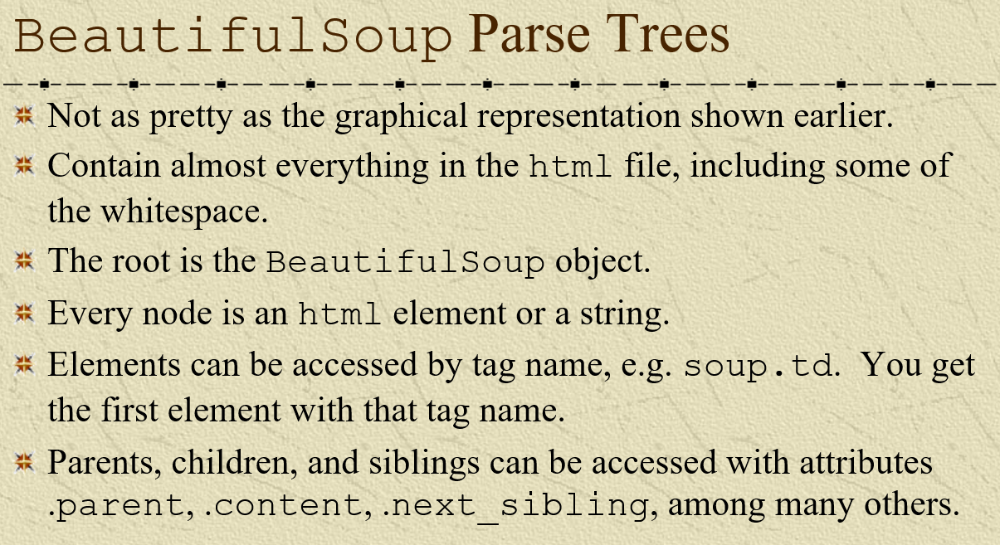

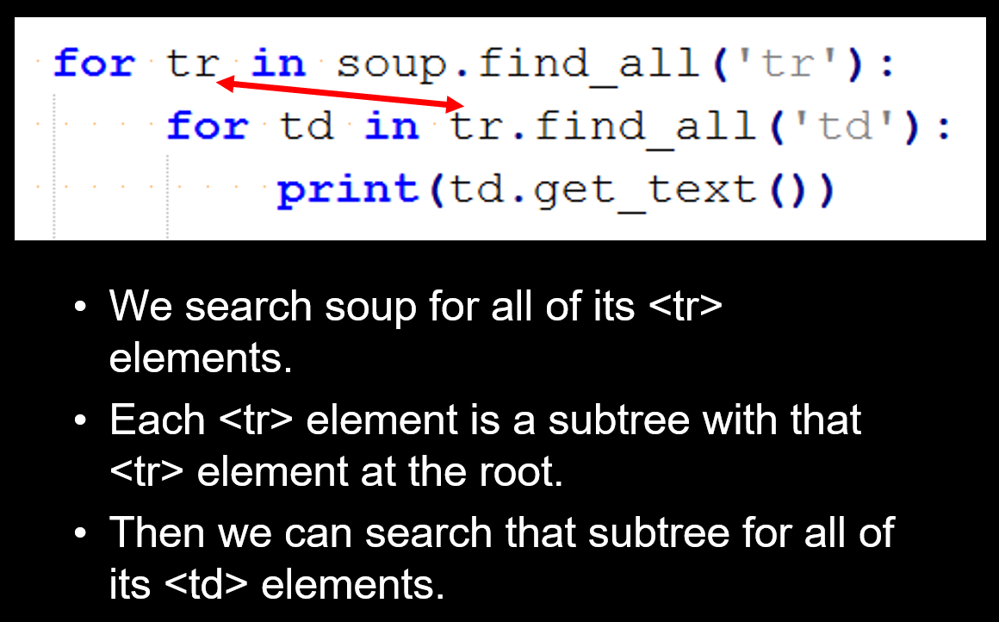

## Worksheet

<font color=red>***Recall that the transpose of a matrix has its rows and columns switched:***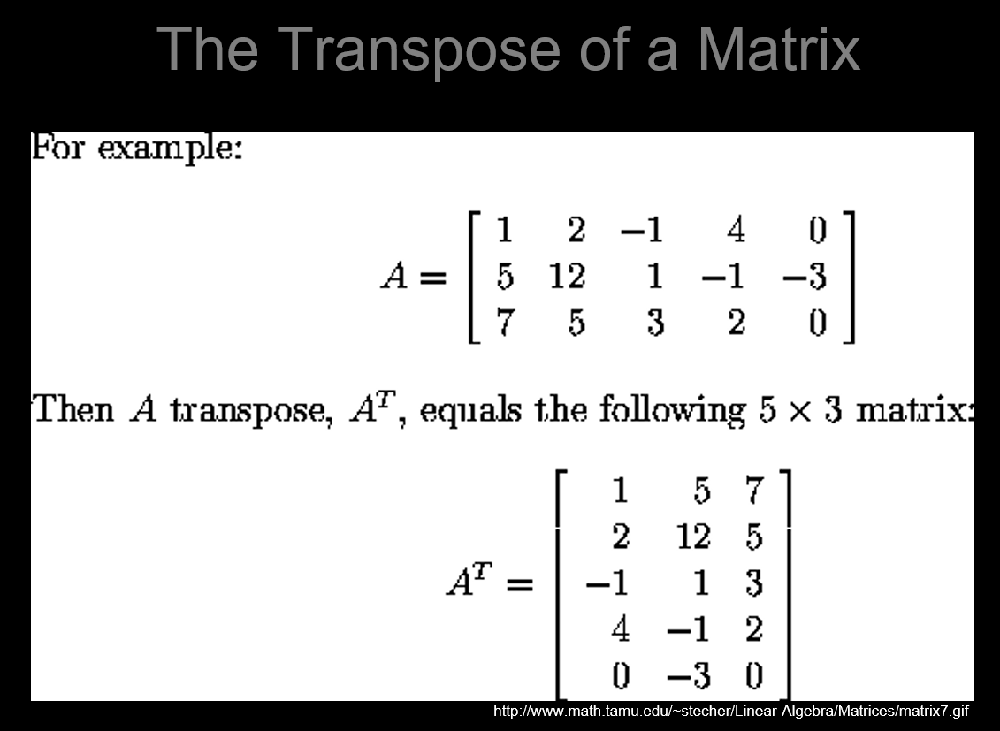

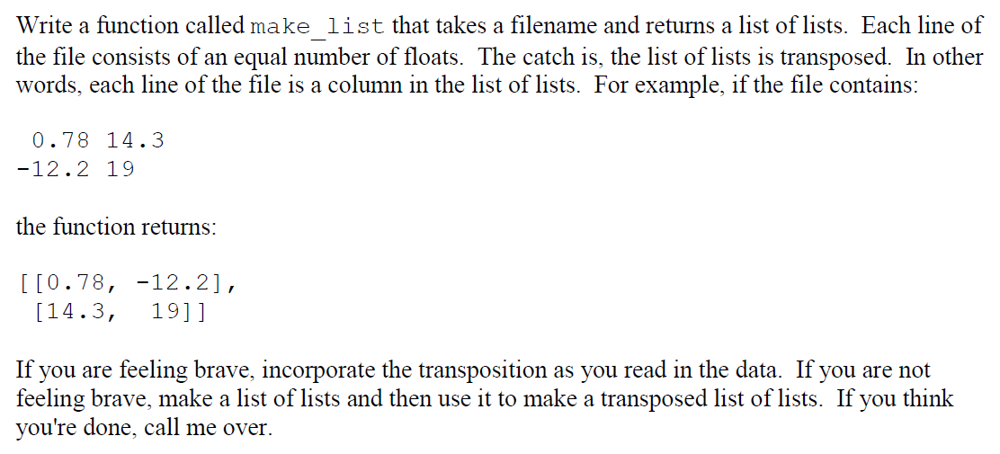

<font color=red>***In this one, we read the data into a list of lists, then create a transposed version from that:***

In [16]:
def make_lists(fname):
    lists = []
    for line in open(fname):
        line = line.split() # line = [float(x) for x in line.split()]
        for i in range(len(line)): 
            line[i] = float(line[i])
        lists.append(line)
    transposed = []
    for _ in lists[0]:
        transposed.append([])
    for lst in lists:
        for i in range(len(lists[0])):
            transposed[i].append(lst[i])
    return transposed

<font color=red>***This one transposes as the file is read:***

In [17]:
def make_lists2(fname):
    lists = []
    fp = open(fname)
    line = [float(x) for x in fp.readline().split()]
    for x in line:
        lists.append([x])
    for line in fp:
        line = [float(x) for x in fp.readline().split()]
        for r in range(len(line)):
            lists[r].append(line[r])
    return lists

<font color=red>***This one's a crazed one-liner that I probably shouldn't even show you that was written by a former student of mine who now works for Microsoft:***

In [18]:
make_lists = lambda f:[[float(x)for l in 
    map(lambda a:a.strip().split(),open(f).readlines())
    for x in l]
    [i::len(open(f).readlines()[0].split())]
    for i in range(len(open(f).readlines()[0].split()))]

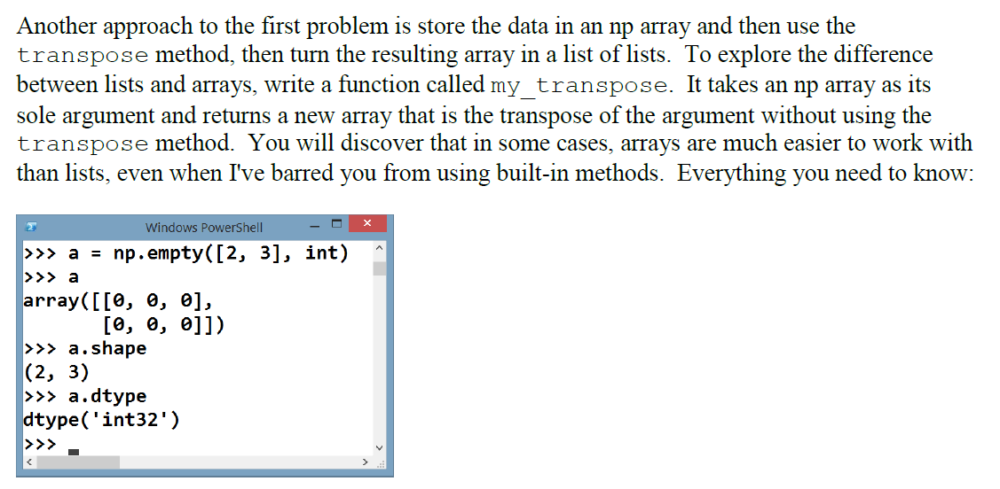

In [19]:
def my_transpose(arr):
    result = np.empty((arr.shape[1], arr.shape[0]))
    for i in range(len(arr)):
        for j in range(len(arr[0])):
            result[j, i] = arr[i, j]
    return result